In [27]:
from IPython.display import HTML
import random

def hide_toggle(for_next=False,ttext="Code"):
    this_cell = """$('div.cell.code_cell.rendered.selected')"""
    next_cell = this_cell + '.next()'

    toggle_text = ttext  # text shown on toggle link
    target_cell = this_cell  # target cell to control with toggle
    js_hide_current = ''  # bit of JS to permanently hide code in current cell (only when toggling next cell)

    if for_next:
        target_cell = next_cell
        toggle_text += ' next cell'
        js_hide_current = this_cell + '.find("div.input").hide();'

    js_f_name = 'code_toggle_{}'.format(str(random.randint(1,2**64)))

    html = """
        <script>
            function {f_name}() {{
                {cell_selector}.find('div.input').toggle();
            }}

            {js_hide_current}
        </script>

        <a href="javascript:{f_name}()">{toggle_text}</a>
    """.format(
        f_name=js_f_name,
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
        toggle_text=toggle_text
    )

    return HTML(html)

hide_toggle(ttext="HTML Code")

- Generate External Temprature accounting master bias
- make all this info and data accessible in a simple way
- Study darks by comparing the two different masters

# Bias Image Analysis of 2019 Cam

In [50]:
import sys
sys.path
sys.path.append('/home/mshaaban/2019_Prelim_Analysis/')

from matplotlib import pyplot as plt
import numpy as np, sys, os
from astropy import units as u
import matplotlib
import copy as cp
import math
from scipy.optimize import curve_fit
from astropy.io import fits
import common_tools as ct 
from jupyterthemes import jtplot
jtplot.style(theme='monokai', grid = False)
#plt.style.use('dark_background')
hide_toggle(ttext="imports")

In [3]:
pre = False
base = "/data2/superbit_2019_flight/"
pre_base = "/data2/superbit_2019_preflight/"
    
bias_path = base + "BiasImages/"
flat_path = base + "FlatImages/"
science_path = base + "ScienceImages/"
dark_path = base + "DarkImages/"

pre_bias_path = pre_base + "BiasImages/"
pre_flat_path = pre_base + "FlatImages/"
pre_science_path = pre_base + "ScienceImages/"
pre_dark_path = pre_base + "DarkImages/"

flight_bias = np.array([bias for bias in os.listdir(bias_path) if ct.is_fits(bias) and os.stat(bias_path + bias).st_size > 59000000])
flight_dark = np.array([dark for dark in os.listdir(dark_path)if ct.is_fits(dark) and os.stat(dark_path + dark).st_size > 59000000])
flight_science = np.array([sci for sci in os.listdir(science_path)if ct.is_fits(sci) and os.stat(science_path + sci).st_size > 59000000])
flight_flats = np.array([flat for flat in os.listdir(flat_path) if ct.is_fits(flat)and os.stat(flat_path + flat).st_size > 59000000])

pre_flight_flats = np.array([flat for flat in os.listdir(pre_flat_path) if ct.is_fits(flat)and os.stat(pre_flat_path + flat).st_size > 59000000])
pre_flight_bias = np.array([bias for bias in os.listdir(pre_bias_path) if ct.is_fits(bias) and os.stat(pre_bias_path + bias).st_size > 59000000])
pre_flight_dark = np.array([dark for dark in os.listdir(pre_dark_path)if ct.is_fits(dark) and os.stat(pre_dark_path + dark).st_size > 59000000])
pre_flight_science = np.array([sci for sci in os.listdir(pre_science_path)if ct.is_fits(sci) and os.stat(pre_science_path + sci).st_size > 59000000])

print("Images Used:")
print(len(flight_flats),"flats used from flight")
print(len(flight_bias), "bias used from flight")
print(len(flight_dark), "darks used from flight")
print(len(flight_science), "sci images used from flight")
print()
print(len(pre_flight_flats), "flats used from ground")
print(len(pre_flight_bias), "bias used from ground")
print(len(pre_flight_dark), "darks used from ground")
print(len(pre_flight_science), "sci images used from ground")

hide_toggle()

Images Used:
(19, 'flats used from flight')
(293, 'bias used from flight')
(90, 'darks used from flight')
(93, 'sci images used from flight')
()
(105, 'flats used from ground')
(243, 'bias used from ground')
(22, 'darks used from ground')
(151, 'sci images used from ground')


## Set Up

In [4]:
# Get the commanded exposure time for the image that corresponds
# to the bias of interest

exptimes = []
bias_imgs = []
ext_temps = []
int_temps = []

for img in flight_science:
    with fits.open(science_path + img) as hdul:
        exptimes.append(hdul[0].header["EXPTIME"])
        ext_temps.append(hdul[0].header["EXTTEMP"])
        int_temps.append(hdul[0].header["INTTEMP"])
        bias_imgs.append(ct.get_corresponding_bias(img,flight_bias))

            
for img in flight_flats:
    with fits.open(flat_path + img) as hdul:
        exptimes.append(hdul[0].header["EXPTIME"])
        ext_temps.append(hdul[0].header["EXTTEMP"])
        int_temps.append(hdul[0].header["INTTEMP"])
        bias_imgs.append(ct.get_corresponding_bias(img,flight_bias))
        
for img in flight_dark:
    with fits.open(dark_path + img) as hdul:
        exptimes.append(hdul[0].header["EXPTIME"])
        ext_temps.append(hdul[0].header["EXTTEMP"])
        int_temps.append(hdul[0].header["INTTEMP"])
        bias_imgs.append(ct.get_corresponding_bias(img,flight_bias))
            
#for img in os.listdir(dark_path):
#    if os.stat(dark_path + img).st_size > 59000000 and ct.is_fits(img):
#        with fits.open(dark_path + img) as hdul:
#            exptimes.append(hdul[0].header["EXPTIME"])
#            bias_imgs.append(ct.get_corresponding_bias(img,bias_path))
            
exptimes = np.array(exptimes)
bias_imgs = np.array(bias_imgs)
int_temps = np.array(int_temps)
ext_temps = np.array(ext_temps)

# Get the image statistics of the bias images of interest
means = []
medians = []
stds = []
times = []

for i in range(len(bias_imgs)):
    with fits.open(bias_path + bias_imgs[i]) as bias:
        means.append(np.mean(bias[0].data))
        medians.append(np.median(bias[0].data))
        stds.append(np.std(bias[0].data))
        times.append(ct.get_time(bias_imgs[i]))
        
pre_exptimes = []
pre_bias_imgs = []
pre_ext_temps = []
pre_int_temps = []

for img in pre_flight_science:
    with fits.open(pre_science_path + img) as hdul:
        pre_exptimes.append(hdul[0].header["EXPTIME"])
        pre_ext_temps.append(hdul[0].header["EXTTEMP"])
        pre_int_temps.append(hdul[0].header["INTTEMP"])
        pre_bias_imgs.append(ct.get_corresponding_bias(img,pre_flight_bias))


for img in pre_flight_flats:
    with fits.open(pre_flat_path + img) as hdul:
        pre_exptimes.append(hdul[0].header["EXPTIME"])
        pre_ext_temps.append(hdul[0].header["EXTTEMP"])
        pre_int_temps.append(hdul[0].header["INTTEMP"])
        pre_bias_imgs.append(ct.get_corresponding_bias(img,pre_flight_bias))

for img in pre_flight_dark:
    with fits.open(pre_dark_path + img) as hdul:
        pre_exptimes.append(hdul[0].header["EXPTIME"])
        pre_ext_temps.append(hdul[0].header["EXTTEMP"])
        pre_int_temps.append(hdul[0].header["INTTEMP"])
        pre_bias_imgs.append(ct.get_corresponding_bias(img,pre_flight_bias))

#for img in os.listdir(dark_path):
#    if os.stat(dark_path + img).st_size > 59000000 and ct.is_fits(img):
#        with fits.open(dark_path + img) as hdul:
#            exptimes.append(hdul[0].header["EXPTIME"])
#            bias_imgs.append(ct.get_corresponding_bias(img,bias_path))

pre_exptimes = np.array(pre_exptimes)
pre_bias_imgs = np.array(pre_bias_imgs)
pre_int_temps = np.array(pre_int_temps)
pre_ext_temps = np.array(pre_ext_temps)


pre_means = []
pre_medians = []
pre_stds = []
pre_times = []

for i in range(len(pre_bias_imgs)):
    with fits.open(pre_bias_path + pre_bias_imgs[i]) as bias:
        pre_means.append(np.mean(bias[0].data))
        pre_medians.append(np.median(bias[0].data))
        pre_stds.append(np.std(bias[0].data))
        pre_times.append(ct.get_time(pre_bias_imgs[i]))
        
        
pre_means = np.array(pre_means)
pre_medians = np.array(pre_medians)
pre_stds = np.array(pre_stds)
pre_times = np.array(pre_times)

means = np.array(means)
medians = np.array(medians)
stds = np.array(stds)
times = np.array(times)

hide_toggle(ttext="Initialize Parameters Code")

In [35]:
def plotimg(img,sig,title="",cb=True):
    mini =np.mean(img)-sig*np.std(img)
    maxi = np.mean(img)+sig*np.std(img)
    plt.figure(figsize=(14,8))
    plt.imshow(img,vmin=mini,vmax=maxi,cmap="viridis")
    if cb:
        plt.colorbar();
    plt.title(title);
    print(np.mean(img),np.std(img))
    
def plothist(img,title="",bins=10000,sig=1,nfig=True,label=""):
    m = np.mean(img)
    s = np.std(img)
    hist, edge = np.histogram(img,bins=bins)
    if nfig:
        plt.figure(figsize=(14,8))
    plt.plot(edge[1:],hist,label=label)
    plt.xlim([m-(sig*s),m+(sig*s)]);
    plt.title(title);
    plt.legend();
    print(m,s)
    
hide_toggle(ttext="Plotting Tools")

## Set Filters

In [6]:
corrupt_bias = ['image_ifc_1568792559_37328_clean.fits',
 'image_ifc_1568790608_27664_sci_30_3.fits',
 'image_ifc_1568781037_138468_dark_1_8.fits']

# filters applied
f1 = np.logical_and(means > 500,stds < 40)
f2 = bias_imgs[f1] != corrupt_bias[0]
f3 = bias_imgs[f1][f2] != corrupt_bias[1]
f4 = bias_imgs[f1][f2][f3] != corrupt_bias[2]
pf1 = pre_int_temps > 0
pf2= pre_stds[pf1] < 300

## Investigative Plots

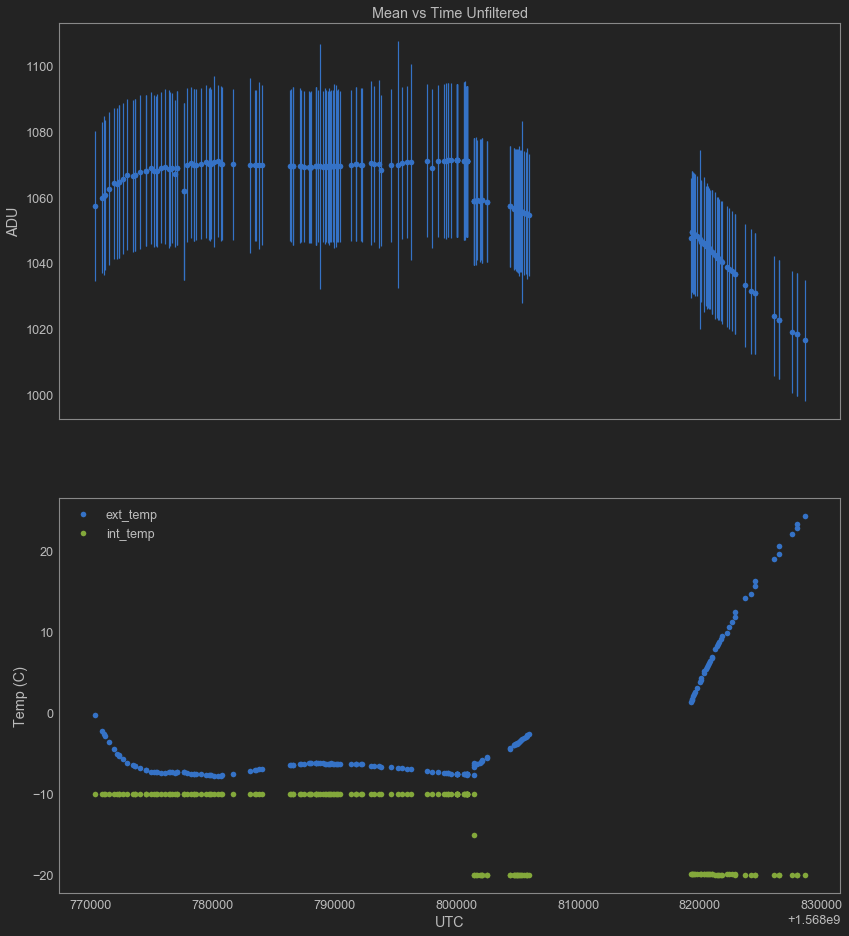

In [111]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
fig.set_figheight(16)
fig.set_figwidth(14)

y = means[f1][f2][f3][f4]
x = times[f1][f2][f3][f4]
err = stds[f1][f2][f3][f4]
ax1.errorbar(x,y,yerr=err,fmt='o')
ax1.set_ylabel("ADU")
ax1.set_title("Mean vs Time Unfiltered");

y = ext_temps[f1][f2][f3][f4]
ax2.plot(x,y,"o",label="ext_temp")
y = int_temps[f1][f2][f3][f4]
ax2.plot(x,y,"o",label="int_temp")
ax2.set_xlabel("UTC")
ax2.set_ylabel("Temp (C)")
ax2.legend();
hide_toggle()

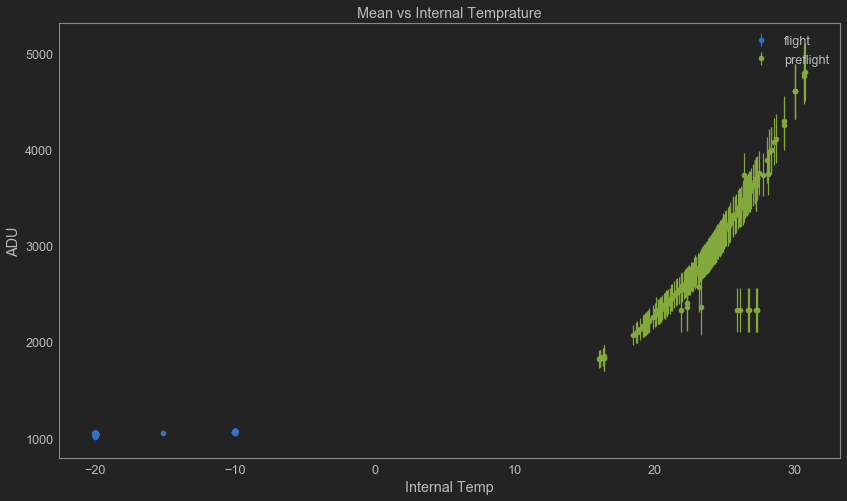

In [112]:
plt.figure("int",figsize=(14,8))
y = means[f1][f2][f3][f4]
x = int_temps[f1][f2][f3][f4]
err = stds[f1][f2][f3][f4]
plt.errorbar(x,y,yerr=err,fmt='o',label="flight")
y = pre_means[pf1][pf2]
x = pre_int_temps[pf1][pf2]
err = pre_stds[pf1][pf2]
plt.errorbar(x,y,yerr=err,fmt='o',label="preflight")
plt.xlabel("Internal Temp")
plt.ylabel("ADU")
plt.title("Mean vs Internal Temprature");
plt.legend();
hide_toggle()

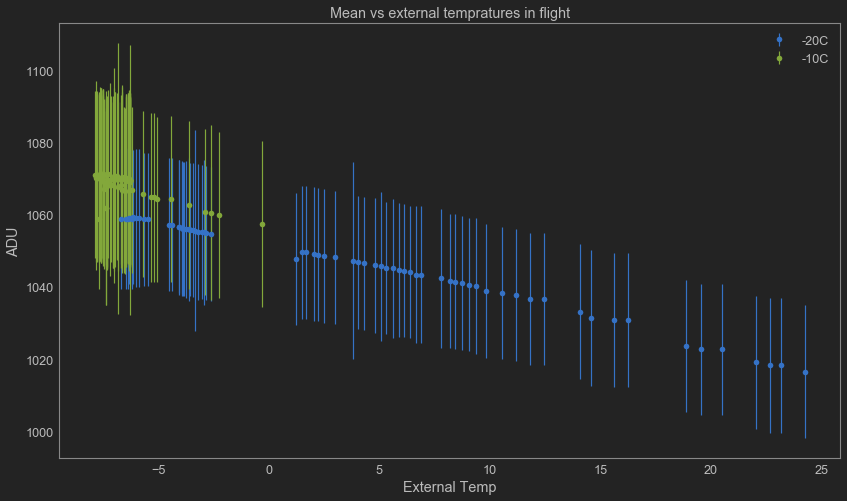

In [113]:
plt.figure("ext",figsize=(14,8))
tf = int_temps[f1][f2][f3][f4] < -15
y = means[f1][f2][f3][f4][tf]
x = ext_temps[f1][f2][f3][f4][tf]
err = stds[f1][f2][f3][f4][tf]
plt.errorbar(x,y,yerr=err,fmt='o',label="-20C")
tf = int_temps[f1][f2][f3][f4] > -15
y = means[f1][f2][f3][f4][tf]
x = ext_temps[f1][f2][f3][f4][tf]
err = stds[f1][f2][f3][f4][tf]
plt.errorbar(x,y,yerr=err,fmt='o',label="-10C")
plt.xlabel("External Temp")
plt.ylabel("ADU")
plt.title("Mean vs external tempratures in flight");
plt.legend();
hide_toggle()

## Master Bias

### -10C

In [114]:
tf = int_temps[f1][f2][f3][f4] > -15

In [7]:
master_bias_mean_10 = np.load("master_bias/master_bias_mean_10_f1-4.npy")
master_bias_median_10 = np.load("master_bias/master_bias_median_10_f1-4.npy")
master_bias_std_10 = np.load("master_bias/master_bias_std_10_f1-4.npy")

In [8]:
master_bias_mean_10 = ct.master_mean(bias_imgs,[f1,f2,f3,f4,tf],bias_path)
master_bias_median_10, master_bias_std_10 = ct.master_estimator(bias_imgs,[f1,f2,f3,f4,tf],bias_path,width=15)
np.save("master_bias/master_bias_mean_10_f1-4",master_bias_mean_10)
np.save("master_bias/master_bias_median_10_f1-4",master_bias_median_10)
np.save("master_bias/master_bias_std_10_f1-4",master_bias_std_10)

(1069.000903668818, 10.315713110247682)
(1069.000903668818, 10.315713110247682)
(1068.022506165504, 10.456821255608284)
(4.82115344951896, 2.2405145124264014)


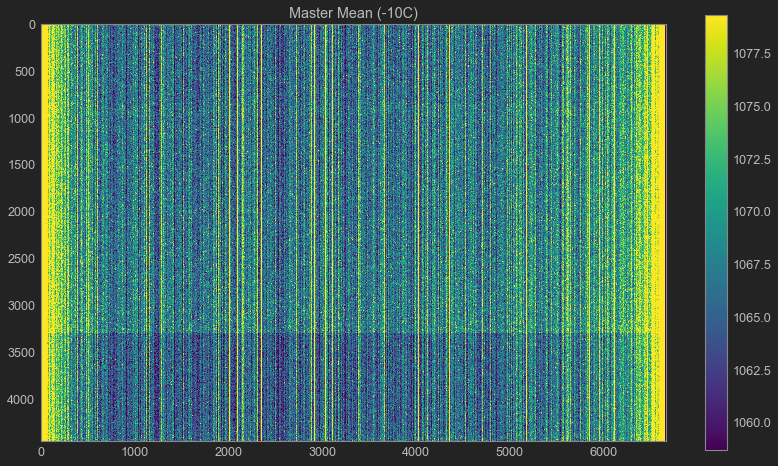

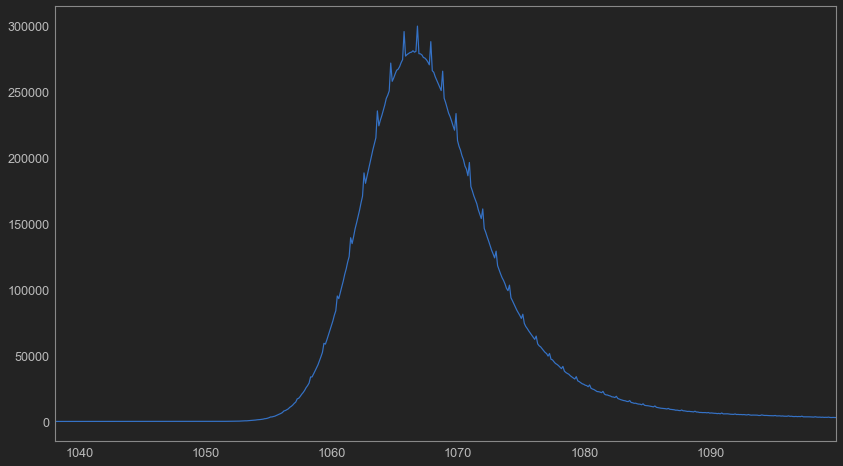

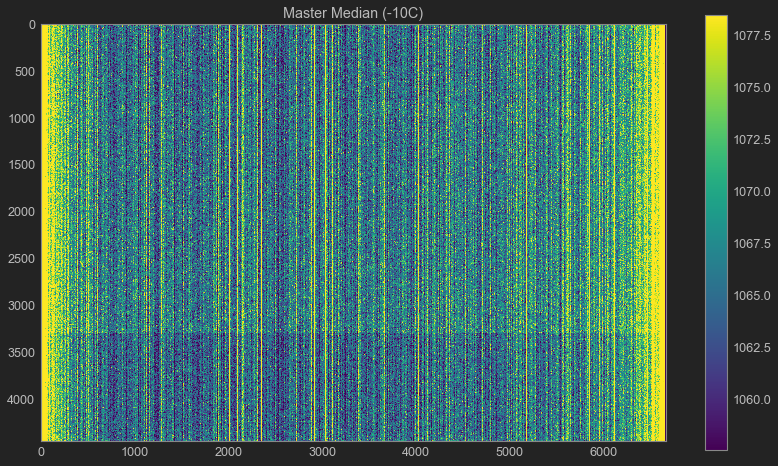

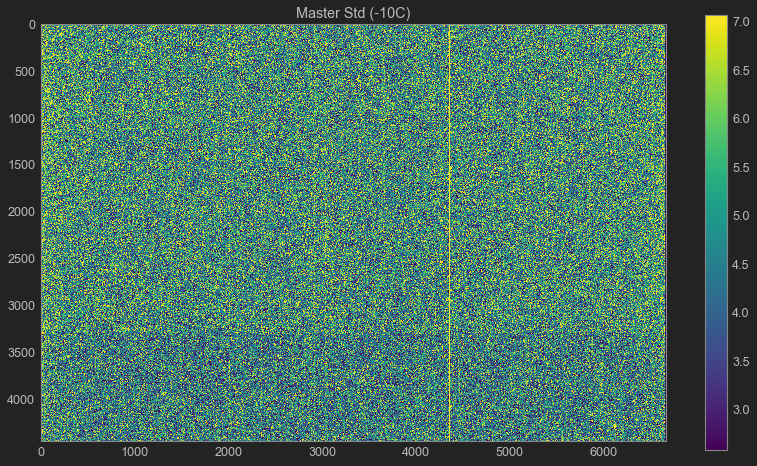

In [53]:
plotimg(master_bias_mean_10,1,"Master Mean (-10C)")
plothist(master_bias_mean_10,sig=3)
plotimg(master_bias_median_10,1,"Master Median (-10C)")
plotimg(master_bias_std_10,1,"Master Std (-10C)")
hide_toggle()

### Feature Analysis

#### Column Variations

(4.862169691972868, 2.5114538069519705)


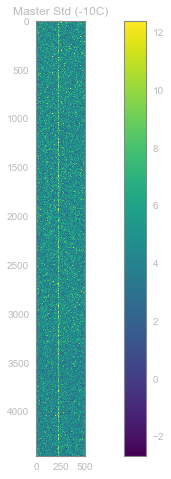

In [11]:
plotimg(master_bias_std_10[:,4000:4500],3,"Master Std (-10C)")
hide_toggle()

In [12]:
col_mean = []
for i in range(np.shape(master_bias_std_10)[1]):
    col_mean.append(np.mean(master_bias_std_10[:,i]))
print(np.sort(col_mean))
print(np.mean(col_mean))
print(np.argmax(col_mean))

[ 2.66870778  2.6831101   2.68622351 ...  8.05639711  8.07533792
 44.61397623]
4.821153449518965
4356


Looking at all the columns of the image we finde that the average variablity in column is 4 counts (ranges from 2 to 6 counts) with exception of one column, column 4356 which has variability of 40 counts

In [62]:
col_means = []
col_stds = []
for i in range(len(bias_imgs)):
    with fits.open(bias_path + bias_imgs[i]) as bias:
        col_means.append(np.mean(bias[0].data[:,4356]))
        col_stds.append(np.std(bias[0].data[:,4356]))

In [63]:
col_means = np.array(col_means)
col_stds = np.array(col_stds)

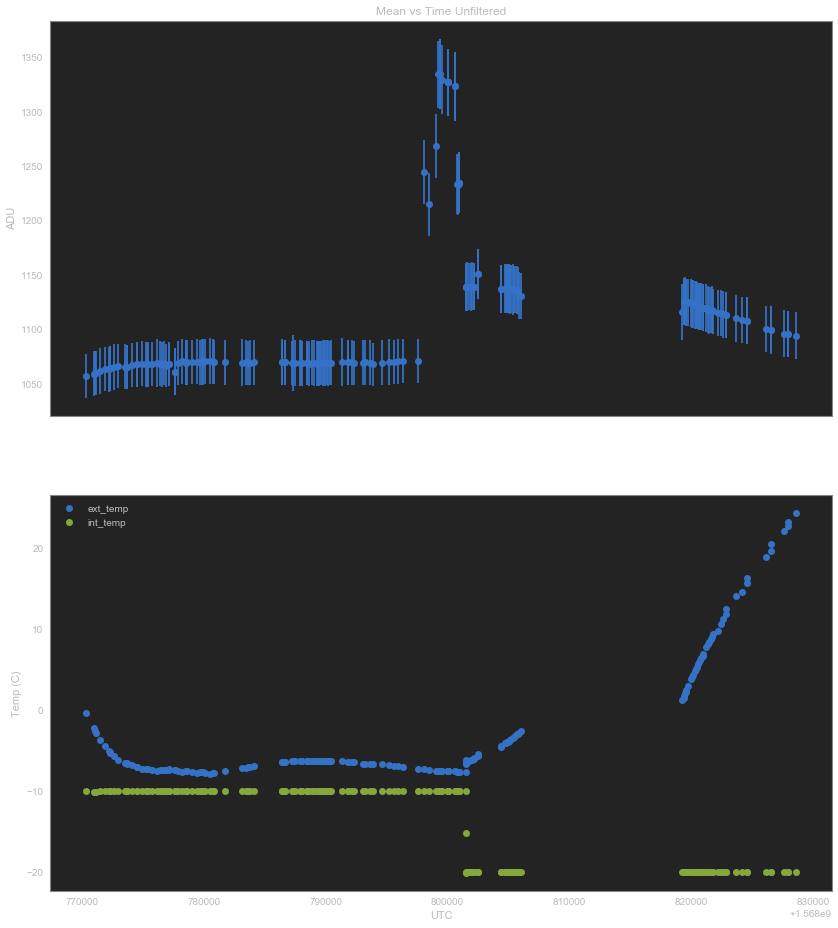

In [15]:
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
fig.set_figheight(16)
fig.set_figwidth(14)

y = col_means[f1][f2][f3][f4]
x = times[f1][f2][f3][f4]
err = col_stds[f1][f2][f3][f4]
ax1.errorbar(x,y,yerr=err,fmt='o')
ax1.set_ylabel("ADU")
ax1.set_title("Mean vs Time Unfiltered");

y = ext_temps[f1][f2][f3][f4]
ax2.plot(x,y,"o",label="ext_temp")
y = int_temps[f1][f2][f3][f4]
ax2.plot(x,y,"o",label="int_temp")
ax2.set_xlabel("UTC")
ax2.set_ylabel("Temp (C)")
ax2.legend();
hide_toggle()

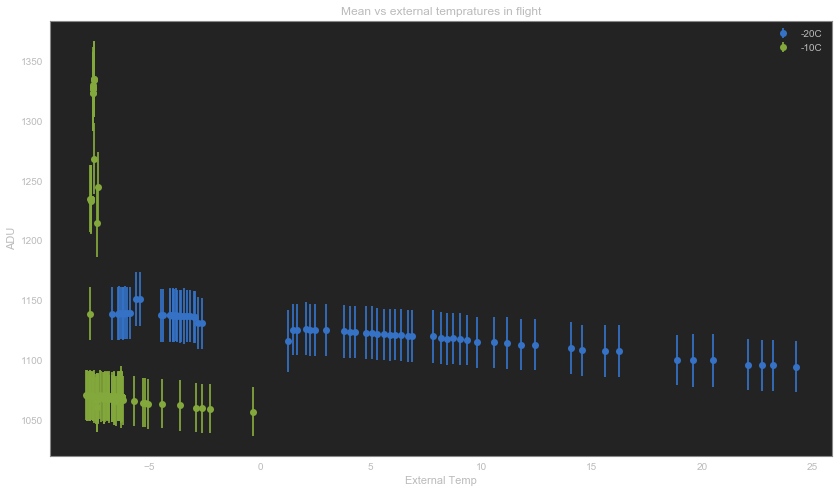

In [16]:
plt.figure("ext",figsize=(14,8))
tf = int_temps[f1][f2][f3][f4] < -15
y = col_means[f1][f2][f3][f4][tf]
x = ext_temps[f1][f2][f3][f4][tf]
err = col_stds[f1][f2][f3][f4][tf]
plt.errorbar(x,y,yerr=err,fmt='o',label="-20C")
tf = int_temps[f1][f2][f3][f4] > -15
y = col_means[f1][f2][f3][f4][tf]
x = ext_temps[f1][f2][f3][f4][tf]
err = col_stds[f1][f2][f3][f4][tf]
plt.errorbar(x,y,yerr=err,fmt='o',label="-10C")
plt.xlabel("External Temp")
plt.ylabel("ADU")
plt.title("Mean vs external tempratures in flight");
plt.legend();
hide_toggle()

In [17]:
tf = int_temps[f1][f2][f3][f4] > -15
cf = col_means[f1][f2][f3][f4][tf] > 1200
print("Images with abnormally bright line")
print(bias_imgs[f1][f2][f3][f4][tf][cf])
hide_toggle()

Images with abnormally bright line
['image_ifc_1568800024_36471_Borisov_10.fits'
 'image_ifc_1568800889_3700_Borisov_10.fits'
 'image_ifc_1568800614_2334_Borisov_30_bonus.fits'
 'image_ifc_1568800024_36471_Borisov_10.fits'
 'image_ifc_1568800889_3700_Borisov_10.fits'
 'image_ifc_1568800889_3700_Borisov_10.fits'
 'image_ifc_1568800889_3700_Borisov_10.fits'
 'image_ifc_1568798505_28934_target_300_G.fits'
 'image_ifc_1568798026_26556_target_300_IR.fits'
 'image_ifc_1568800024_36471_Borisov_10.fits'
 'image_ifc_1568799196_32359_Borisov_60_halpha.fits'
 'image_ifc_1568799346_33105_Borisov_1_UV.fits'
 'image_ifc_1568800889_3700_Borisov_10.fits'
 'image_ifc_1568800024_36471_Borisov_10.fits'
 'image_ifc_1568799568_34208_Borisov_300.fits'
 'image_ifc_1568800889_3700_Borisov_10.fits'
 'image_ifc_1568800024_36471_Borisov_10.fits'
 'image_ifc_1568799346_33105_Borisov_1_UV.fits'
 'image_ifc_1568799021_31490_Borisov_60.fits'
 'image_ifc_1568800614_2334_Borisov_30_bonus.fits'
 'image_ifc_1568800889_3

All these images where taken after the new temprature was commanded however none of them are at a reported internal temprature of -20 so perhaps in the process of cooling that impacts specifically that line or that line has slightly higher sensitity so it amplifies the external temprature effect

In [103]:
col_means = []
col_stds = []
for i in range(len(flight_science)):
    with fits.open(science_path + flight_science[i]) as bias:
        col_means.append(np.mean(bias[0].data[:,4356]))
        col_stds.append(np.std(bias[0].data[:,4356]))
        
col_means = np.array(col_means)
col_stds = np.array(col_stds)

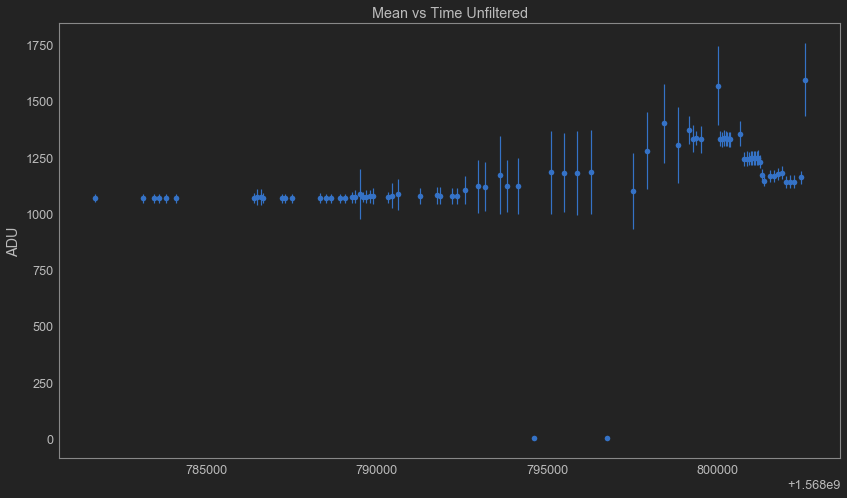

In [109]:
ts = np.vectorize(ct.get_time)(flight_science)

fig, (ax1) = plt.subplots(1, 1, sharex=True)
fig.set_figheight(8)
fig.set_figwidth(14)

y = col_means[col_means<10000]
x = ts[col_means<10000]
err = col_stds[col_means<10000]
ax1.errorbar(x,y,yerr=err,fmt='o')
ax1.set_ylabel("ADU")
ax1.set_title("Mean vs Time Unfiltered");

hide_toggle()

In [18]:
print("Mean, std of the bright column images:")
print(np.mean(means[f1][f2][f3][f4][tf][cf]),np.mean(stds[f1][f2][f3][f4][tf][cf]))

print("Mean, std of the rest of the rest of the images:")
cf = col_means[f1][f2][f3][f4][tf] < 1200
print(np.mean(means[f1][f2][f3][f4][tf][cf]),np.mean(stds[f1][f2][f3][f4][tf][cf]))
hide_toggle()

Mean, std of the bright column images:
(1071.0631751299604, 23.379498144785337)
Mean, std of the rest of the rest of the images:
(1068.4582006527314, 23.815155158379817)


In [8]:
master_bias_mean_10_cf = np.load("master_bias/master_bias_mean_10_f1-cf.npy")
master_bias_median_10_cf = np.load("master_bias/master_bias_median_10_f1-cf.npy")
master_bias_std_10_cf = np.load("master_bias/master_bias_std_10_f1-cf.npy")

In [19]:
tf = int_temps[f1][f2][f3][f4] > -15
cf = col_means[f1][f2][f3][f4][tf] < 1200
master_bias_mean_10_cf = ct.master_mean(bias_imgs,[f1,f2,f3,f4,tf,cf],bias_path)
master_bias_median_10_cf, master_bias_std_10_cf = ct.master_estimator(bias_imgs,[f1,f2,f3,f4,tf,cf],bias_path,width=15)
np.save("master_bias/master_bias_mean_10_f1-cf",master_bias_mean_10_cf)
np.save("master_bias/master_bias_median_10_f1-cf",master_bias_median_10_cf)
np.save("master_bias/master_bias_std_10_f1-cf",master_bias_std_10_cf)

(1068.4582006527316, 10.235879199216289)
(1068.4582006527316, 10.235879199216289)
(1067.3944245212438, 10.375541049024175)
(4.596282643178319, 2.3311846558743414)


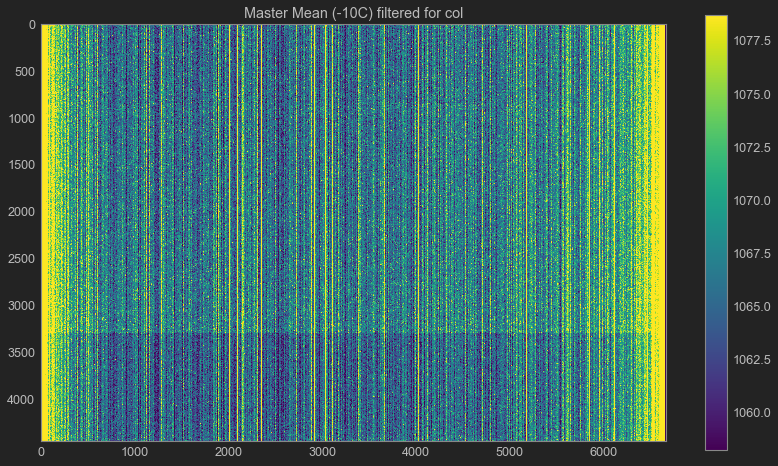

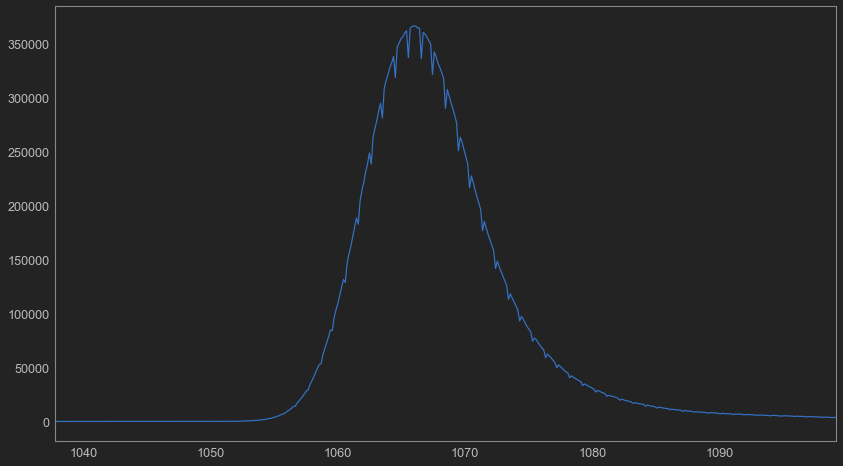

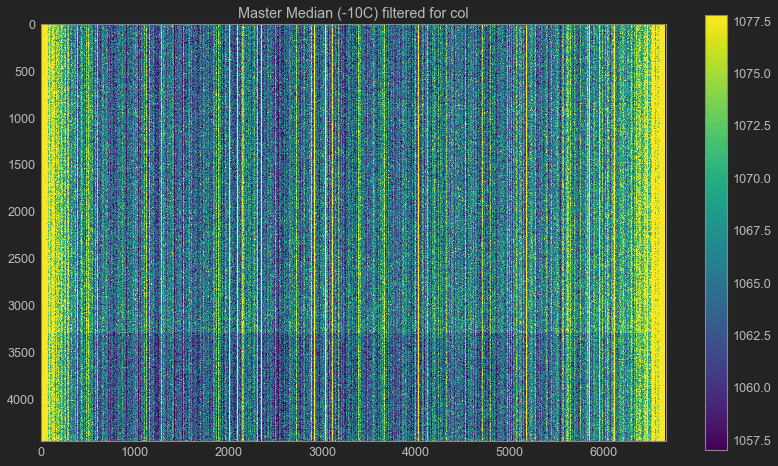

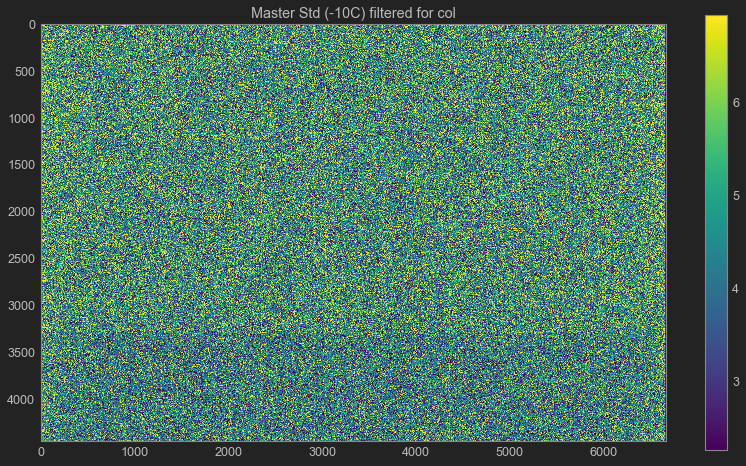

In [52]:
plotimg(master_bias_mean_10_cf,1,"Master Mean (-10C) filtered for col")
plothist(master_bias_mean_10_cf,sig=3)
plotimg(master_bias_median_10_cf,1,"Master Median (-10C) filtered for col")
plotimg(master_bias_std_10_cf,1,"Master Std (-10C) filtered for col")
hide_toggle()

The high variability strip seems to have disappeared

#### Sample Subtraction

In [33]:
%matplotlib inline

(1181.014748791622, 501.48597534927865)
(1181.014748791622, 501.48597534927865)
(1177.5057395159479, 471.4888630845961)
(1177.5057395159479, 471.4888630845961)
(112.55654813889026, 501.3821233039525)
(112.55654813889026, 501.3821233039525)
(109.04753886321635, 471.37042147371534)
(109.04753886321635, 471.37042147371534)


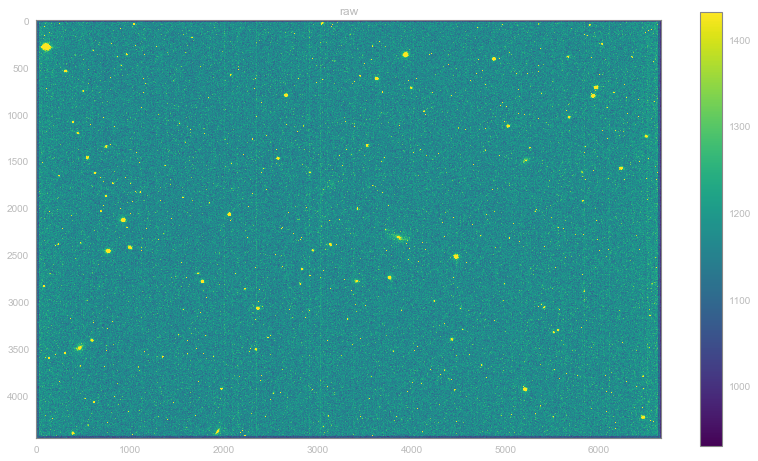

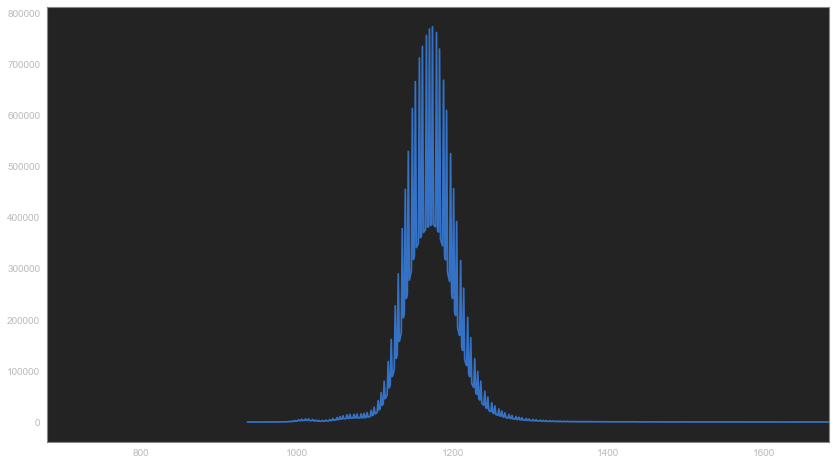

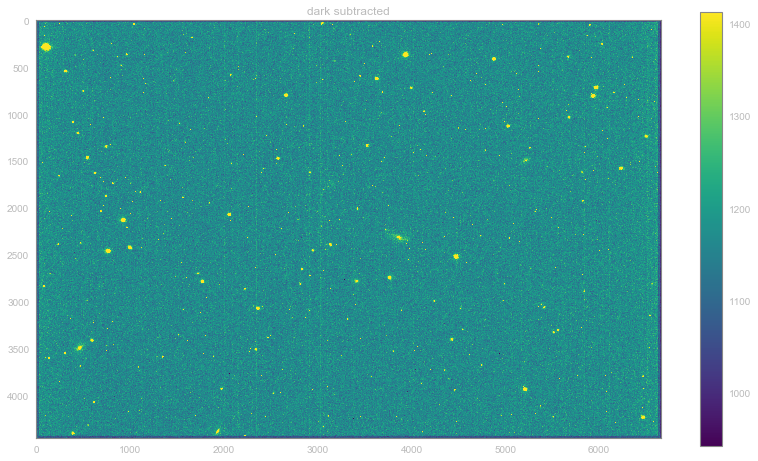

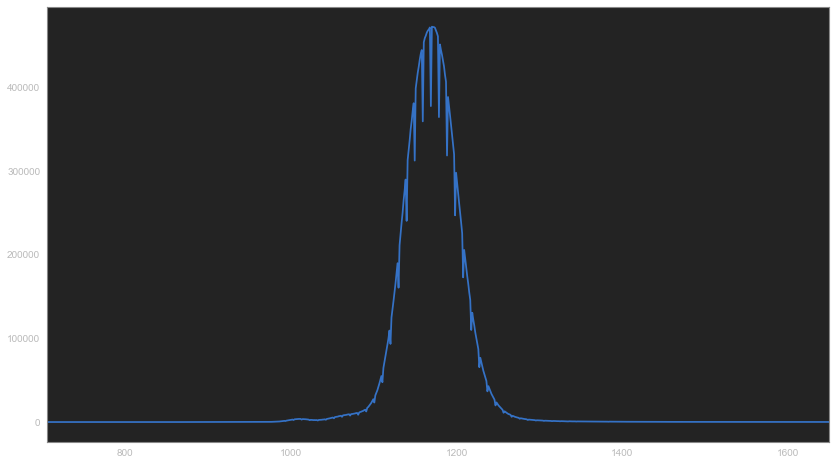

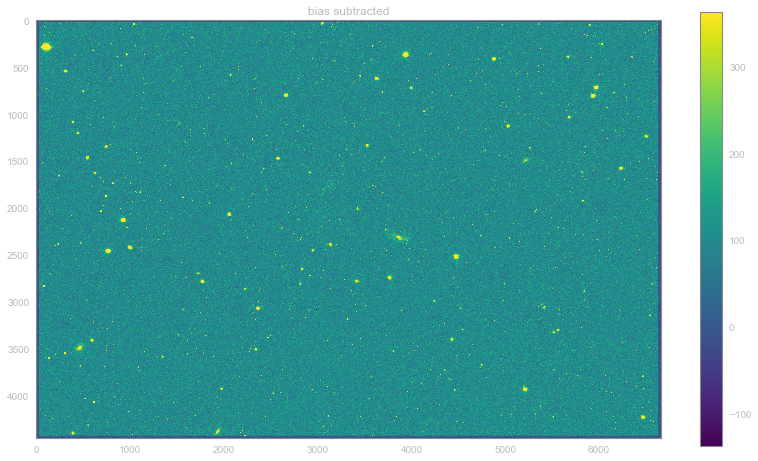

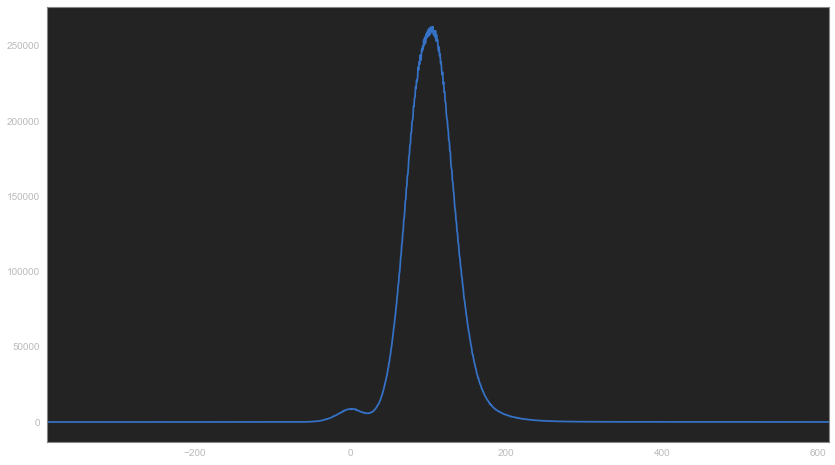

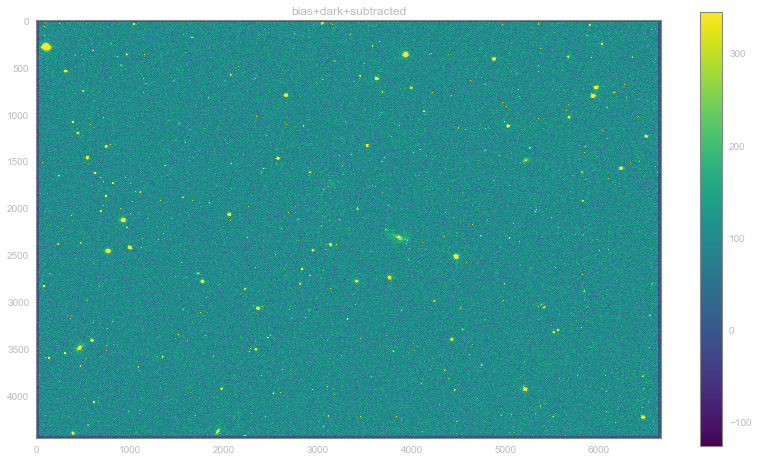

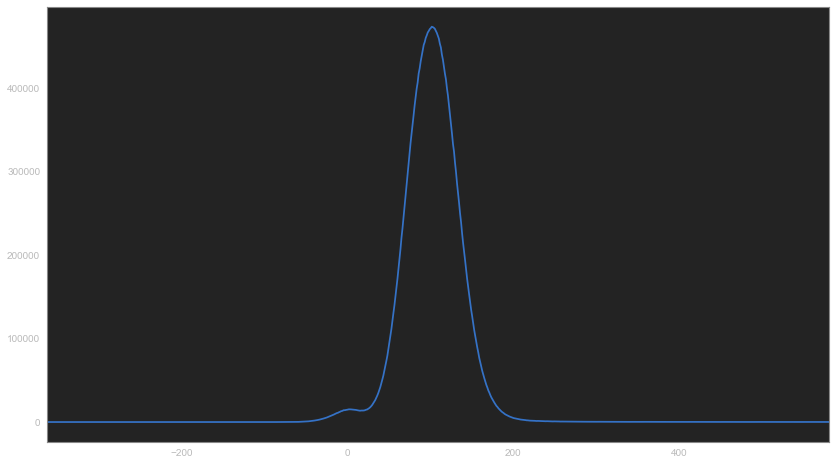

In [38]:
dark = np.load("master_dark/mbias/master_dark_median_10_300000ms.npy")
sci = "image_ifc_1568795884_15916_target_300.fits"
with fits.open(science_path + sci) as hdul:
    img = hdul[0].data# - master_bias_mean_10_cf -dark
    #img = img.clip(min=0)
    plotimg(img,0.5,title="raw")
    plothist(img,bins=50000)
    
    img = hdul[0].data -dark
    #img = img.clip(min=0)
    plotimg(img,0.5,title="dark subtracted")
    plothist(img,bins=100000)
    
    img = hdul[0].data - master_bias_mean_10_cf
    #img = img.clip(min=0)
    plotimg(img,0.5,title="bias subtracted")
    plothist(img,bins=100000)
    
    img = hdul[0].data - master_bias_mean_10_cf -dark
    #img = img.clip(min=0)
    plotimg(img,0.5,title="bias+dark+subtracted")
    plothist(img,bins=100000)
hide_toggle()

In [21]:
def fits_open(name, scale_exp=False):
    """wrapper around fits.open that handles non-standard BSCALE/BZERO use"""
    hdus = fits.open(name, do_not_scale_image_data=True)
    try:
        bscale = hdus[0].header["BSCALE"]
    except KeyError:
        # new processed images don't have BSCALE, but do have its inverse
        bscale = 1. / hdus[0].header["SCALE_IM"]
    bzero = hdus[0].header["BZERO"]
    if scale_exp:
        bscale /= hdus[0].header[scale_exp]
    hdus[0].data = (hdus[0].data + bzero) * bscale
    return hdus

hide_toggle()

(109.95929653870913, 471.3403886813181)
(109.04753886321635, 471.37042147371534)
(149.62572025844705, 433.99507029525597)


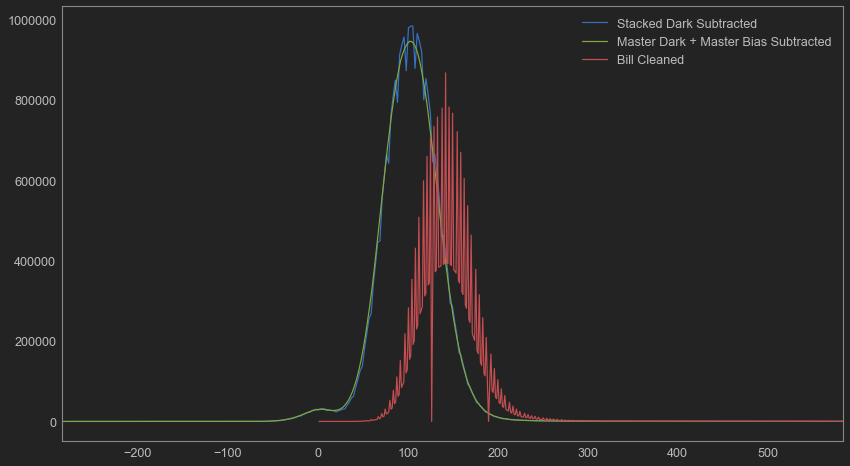

In [156]:
wdark = np.load("master_dark/wbias/master_dark_median_10_300000ms.npy")
dark = np.load("master_dark/mbias/master_dark_median_10_300000ms.npy")
sci = "image_ifc_1568795884_15916_target_300.fits"
with fits.open(science_path + sci) as hdul:
    img = hdul[0].data -wdark
    #img = img.clip(min=0)
    plothist(img,bins=50000,label="Stacked Dark Subtracted")
    img = hdul[0].data - master_bias_mean_10_cf -dark #- np.median(master_bias_mean_10_cf) + p(hdul[0].header['EXTTEMP'])
    plothist(img,bins=50000,nfig=False,label="Master Dark + Master Bias Subtracted")
    
im = "image_ifc_1568795884_15916_target_300_mbias.fits"
with fits_open(im) as hdul:
    img = hdul[0].data
    plothist(img,bins=50000,nfig=False,label="Bill Cleaned")

hide_toggle()

#### Horizontal Strip

(1069.0321149962492, 10.391137350624927)
(1068.106589347337, 10.521844907449486)
(4.748318370381356, 2.0352143236863447)


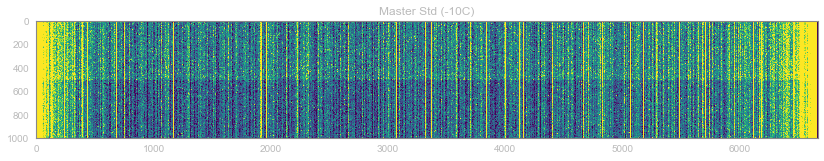

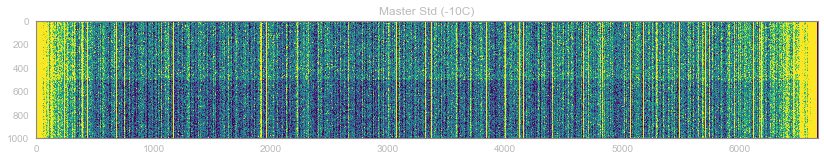

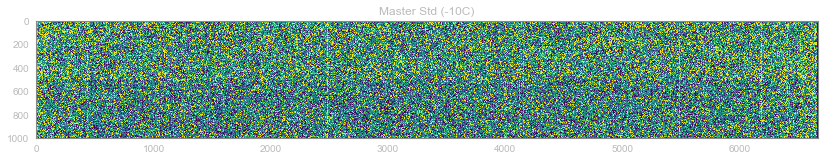

In [26]:
plotimg(master_bias_mean_10[2800:3800,:],1,"Master Std (-10C)",False)
plotimg(master_bias_median_10[2800:3800,:],1,"Master Std (-10C)",False)
plotimg(master_bias_std_10[2800:3800,:],1,"Master Std (-10C)",False)
hide_toggle()

In [27]:
row_means = []
row_stds = []
for i in range(np.shape(master_bias_mean_10_cf)[0]):
    row_means.append(np.mean(master_bias_mean_10_cf[i,:]))
    row_stds.append(np.std(master_bias_mean_10_cf[i,:]))

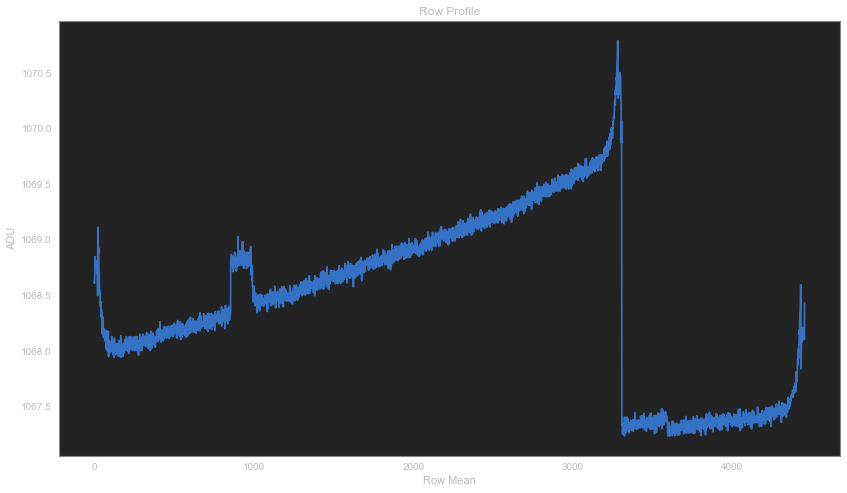

In [28]:
row_means = np.array(row_means)
row_stds = np.array(row_stds)
plt.figure(figsize=(14,8))
plt.plot(row_means);
plt.title("Row Profile")
plt.ylabel("ADU")
plt.xlabel("Row Mean");
hide_toggle()

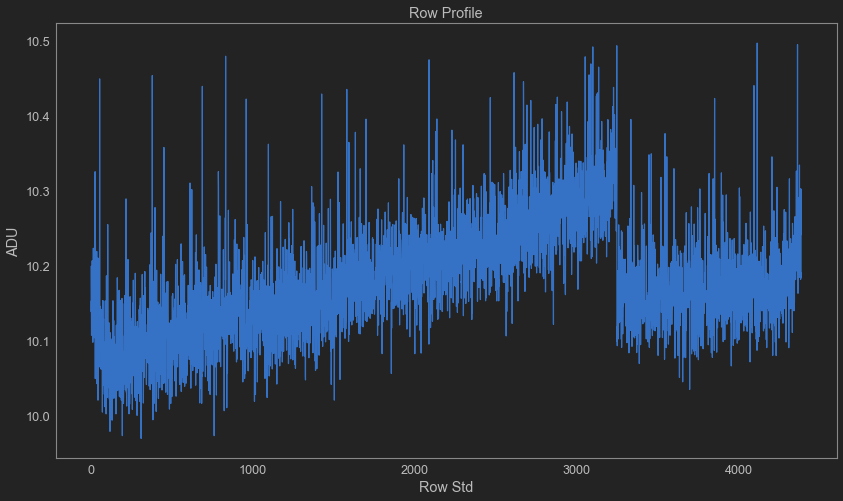

In [37]:
plt.figure(figsize=(14,8))
plt.plot(row_stds[row_stds<10.5]);
plt.title("Row Profile")
plt.ylabel("ADU")
plt.xlabel("Row Std");
hide_toggle()

In [44]:
diff = []

for bias in bias_imgs:
    with fits.open(bias_path + bias) as hdul:
        im = np.array(hdul[0].data,dtype=np.int32)
        diff.append(np.mean(im[np.argmax(row_means),:])-np.mean(im[np.argmin(row_means),:]))

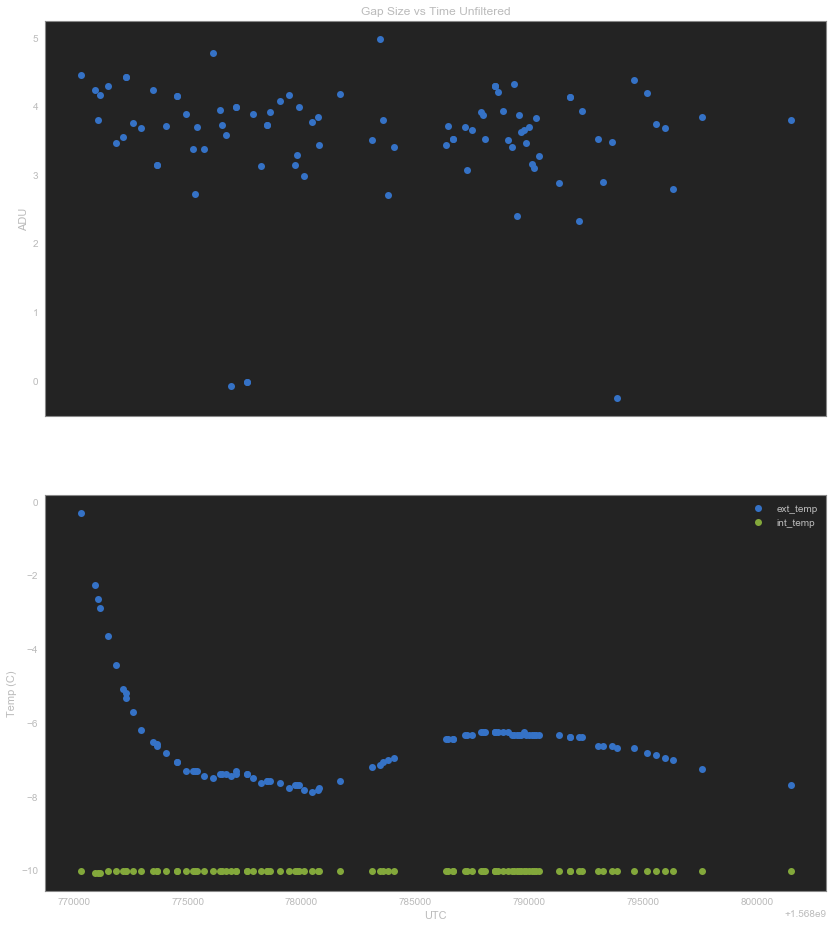

In [45]:
diff = np.array(diff)
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
fig.set_figheight(16)
fig.set_figwidth(14)

y = diff[f1][f2][f3][f4][tf][cf]
x = times[f1][f2][f3][f4][tf][cf]
ax1.plot(x,y,'o')
ax1.set_ylabel("ADU")
ax1.set_title("Gap Size vs Time Unfiltered");

y = ext_temps[f1][f2][f3][f4][tf][cf]
ax2.plot(x,y,"o",label="ext_temp")
y = int_temps[f1][f2][f3][f4][tf][cf]
ax2.plot(x,y,"o",label="int_temp")
ax2.set_xlabel("UTC")
ax2.set_ylabel("Temp (C)")
ax2.legend();
hide_toggle()

Seems like the drop depends on nothing so I run the same code on darks

In [47]:
diff = []

for dark in flight_dark:
    with fits.open(dark_path + dark) as hdul:
        if hdul[0].header['EXPTIME'] < 20000:
            im = np.array(hdul[0].data,dtype=np.int32)
            diff.append(np.mean(im[np.argmax(row_means),:])-np.mean(im[np.argmin(row_means),:]))

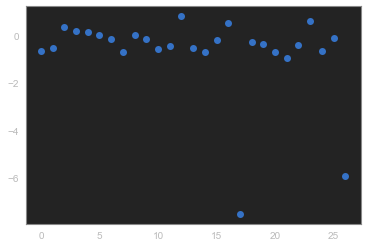

In [49]:
diff = np.array(diff)
plt.plot(diff[diff>-10],"o");

Note that this effect is not in the darks! This implies that this effect could be due to slightly different mode of operation ? 

### Ext Temp Regulated Master

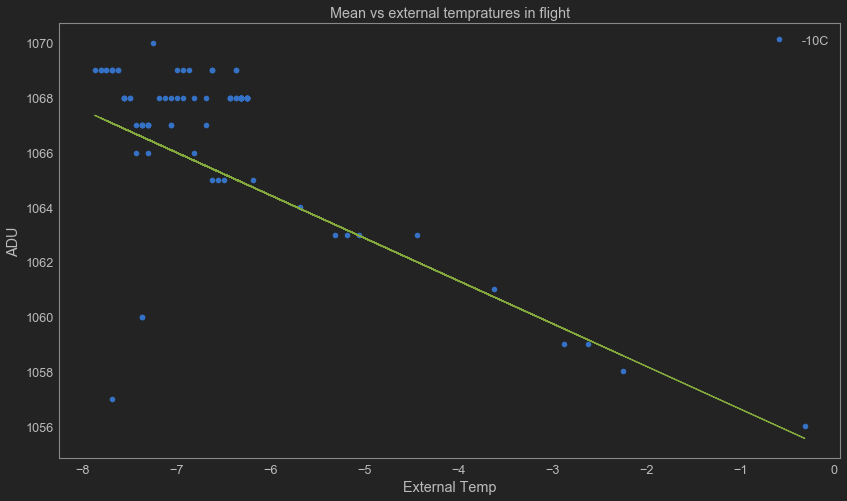

In [134]:
plt.figure("ext",figsize=(14,8))
ef = ext_temps[f1][f2][f3][f4][tf][cf] > -6
yy = medians[f1][f2][f3][f4][tf][cf][ef]
xx = ext_temps[f1][f2][f3][f4][tf][cf][ef]
z = np.polyfit(xx,yy,1)
p = np.poly1d(z)
y = medians[f1][f2][f3][f4][tf][cf]
x = ext_temps[f1][f2][f3][f4][tf][cf]
plt.plot(x,y,'o',label="-10C")
plt.plot(x,p(x))
plt.xlabel("External Temp")
plt.ylabel("ADU")
plt.title("Mean vs external tempratures in flight");
plt.legend();
hide_toggle()

In [149]:
fimgs = bias_imgs[f1][f2][f3][f4][tf][cf]
sum_arr = np.zeros((4453,6665))
for img in fimgs:
    with fits.open(bias_path + img) as hdul:
        ext = hdul[0].header["EXTTEMP"]
        dd = np.median(hdul[0].data) - p(ext)
        sum_arr += hdul[0].data - dd

mean_arr = sum_arr/len(fimgs)
del sum_arr

(-1.608380381087041, 9.258545492950651e-14)
(1067.3944245212438, 10.375541049024175)


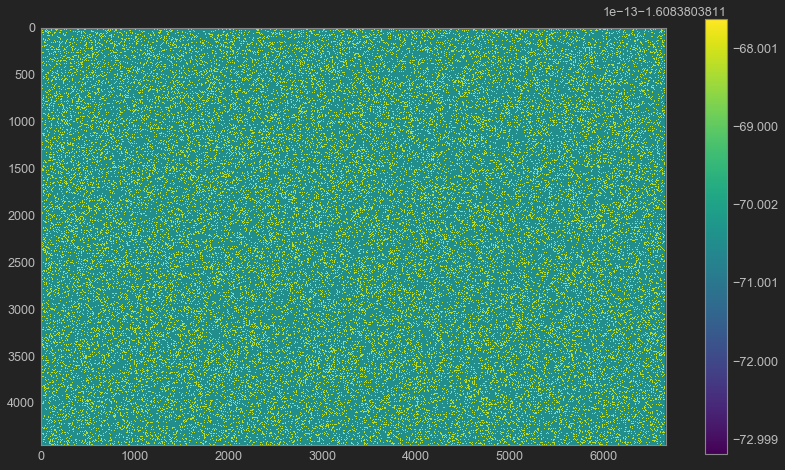

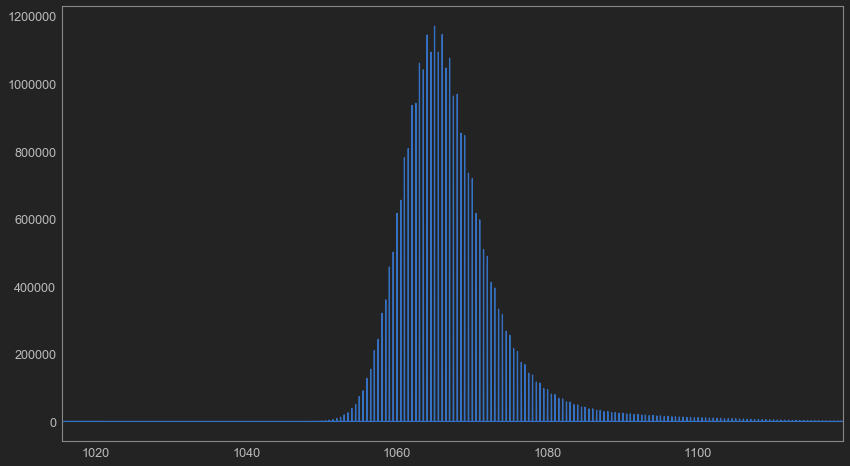

In [154]:
plotimg(mean_arr- master_bias_mean_10_cf,3)
plothist(master_bias_median_10_cf,sig=5,bins=15000)

### -20 C

In [91]:
tf = int_temps[f1][f2][f3][f4] < -15
master_bias_mean_20 = ct.master_mean(bias_imgs,[f1,f2,f3,f4,tf],bias_path)

In [172]:
master_bias_median_20, master_bias_std_20 = ct.master_estimator(bias_imgs,[f1,f2,f3,f4,tf],bias_path,width=10)

(1046.3440221787494, 6.971272571986676)
(1045.670651140216, 7.383878962321427)
(7.345470950955014, 2.5119089899675906)


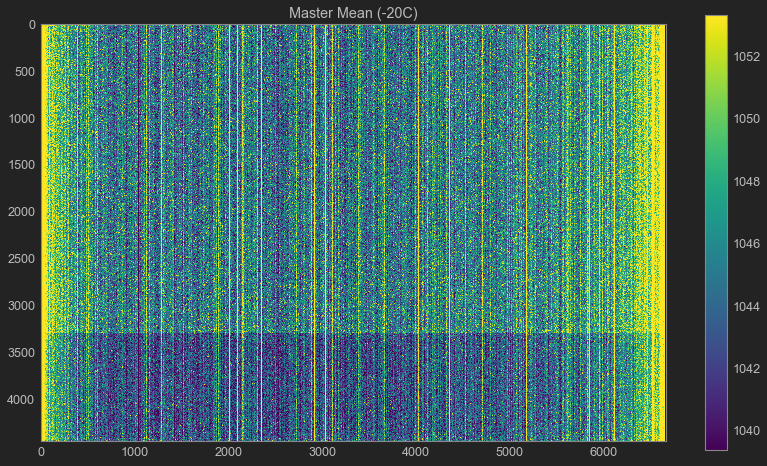

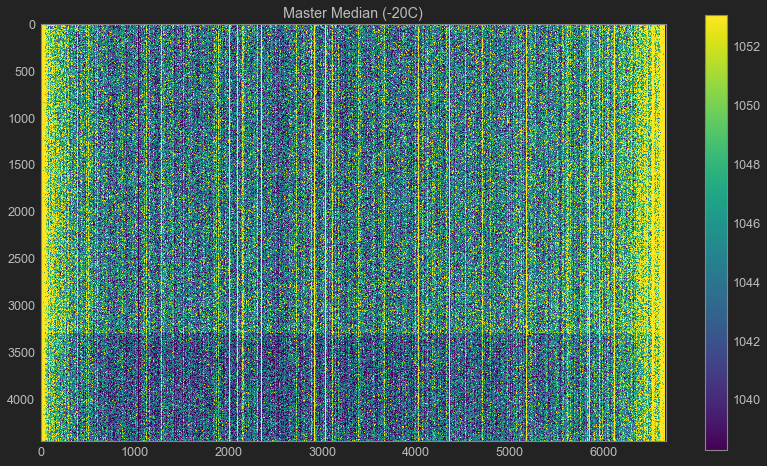

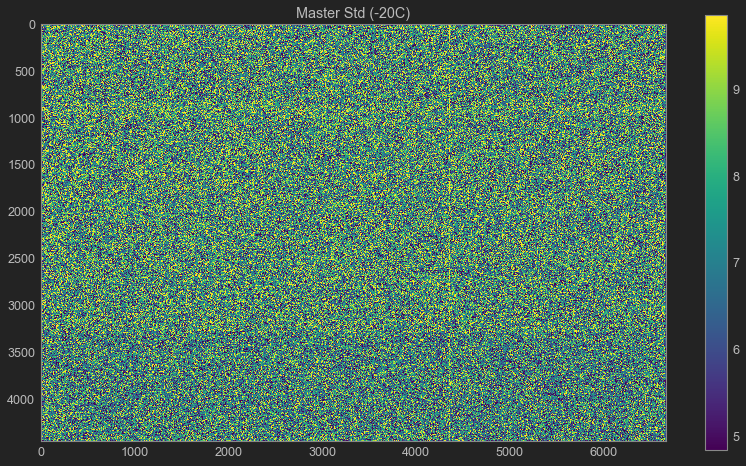

In [173]:
plotimg(master_bias_mean_20,1,"Master Mean (-20C)")
plotimg(master_bias_median_20,1,"Master Median (-20C)")
plotimg(master_bias_std_20,1,"Master Std (-20C)")
hide_toggle()

In [174]:
col_mean = []
for i in range(np.shape(master_bias_std_20)[1]):
    col_mean.append(np.mean(master_bias_std_20[:,i]))
print(np.sort(col_mean))
print(np.mean(col_mean))
print(np.argmax(col_mean))

[ 6.17549266  6.17787131  6.18844025 ...  9.94193951 10.11905328
 10.3706054 ]
7.345470950955025
3484


In [68]:
print(len(bias_imgs[f1][f2][f3][f4][tf][cf]))
print(len(bias_imgs[int_temps>-12]))

95
132


In [64]:
cf = col_means[f1][f2][f3][f4][tf] < 1200

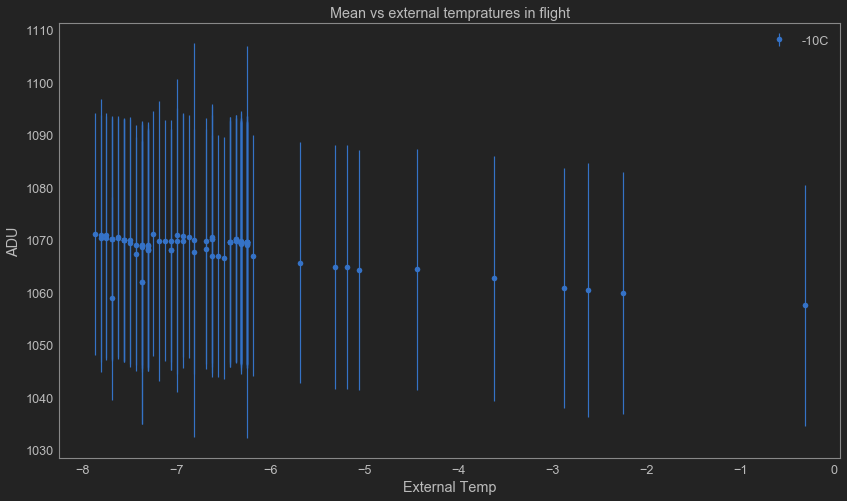

In [69]:
plt.figure("ext",figsize=(14,8))
y = means[f1][f2][f3][f4][tf][cf]
x = ext_temps[f1][f2][f3][f4][tf][cf]
err = stds[f1][f2][f3][f4][tf][cf]
plt.errorbar(x,y,yerr=err,fmt='o',label="-10C")
plt.xlabel("External Temp")
plt.ylabel("ADU")
plt.title("Mean vs external tempratures in flight");
plt.legend();
hide_toggle()

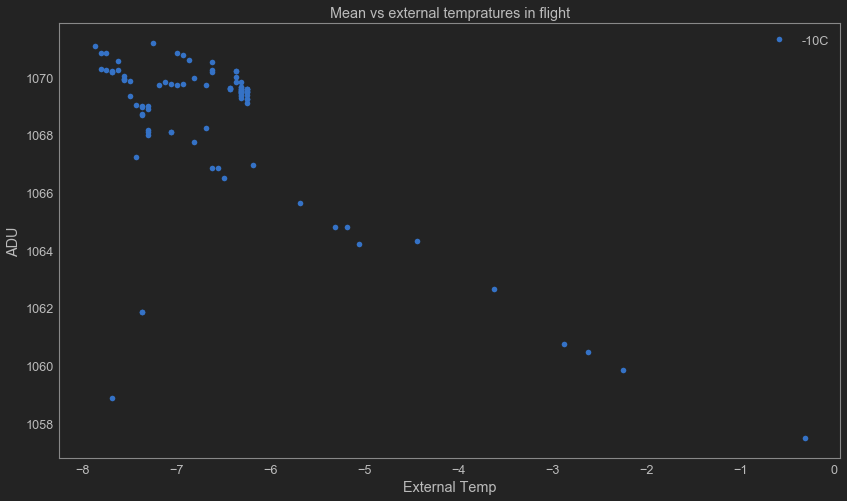

In [71]:
plt.figure("ext",figsize=(14,8))
y = means[f1][f2][f3][f4][tf][cf]
x = ext_temps[f1][f2][f3][f4][tf][cf]
plt.plot(x,y,'o',label="-10C")
plt.xlabel("External Temp")
plt.ylabel("ADU")
plt.title("Mean vs external tempratures in flight");
plt.legend();
hide_toggle()

(-0.5164441491547052, 85.21062486447131)
(4.779197540203679e-15, 85.21062486447131)
(-9.958944529925834e-14, 85.7331896592832)


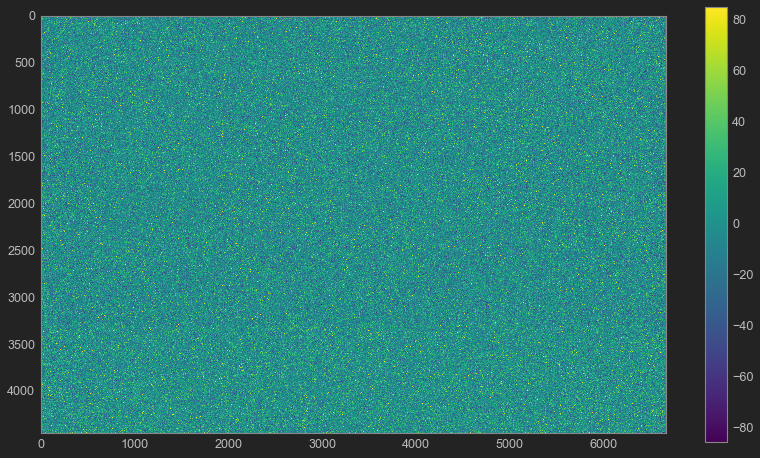

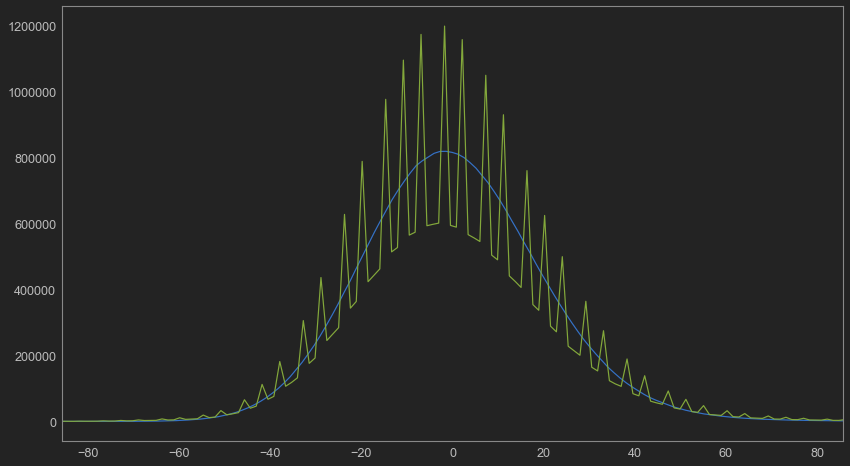

In [85]:
with fits.open(dark_path + temp[10]) as hdul:
    img = hdul[0].data - master_bias_mean_10_cf
    plotimg(img,1)
    plothist(img - np.mean(img),bins=50000)
    plothist(hdul[0].data - np.mean(hdul[0].data),nfig=False,bins=50000)

(3.50900927567396, 168.88145370725914)


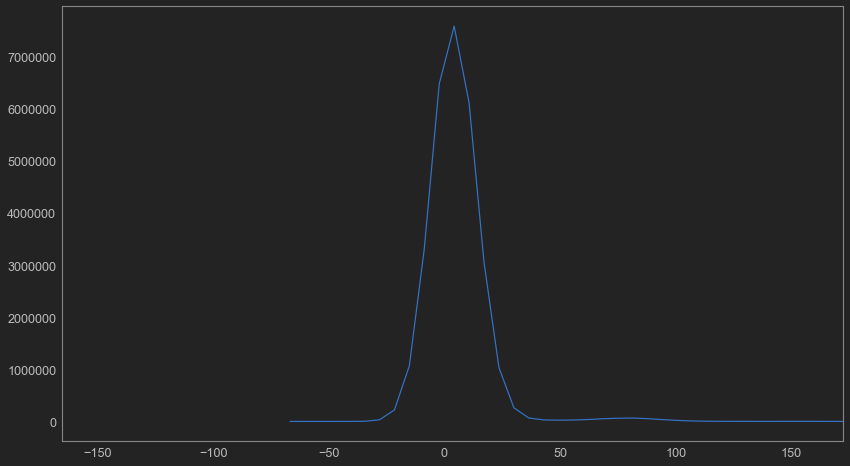

In [99]:
plothist(dark)

(2.2266395866344015, 7.303416613068001)
(2.2266395866344015, 7.303416613068001)
66.0458354509674


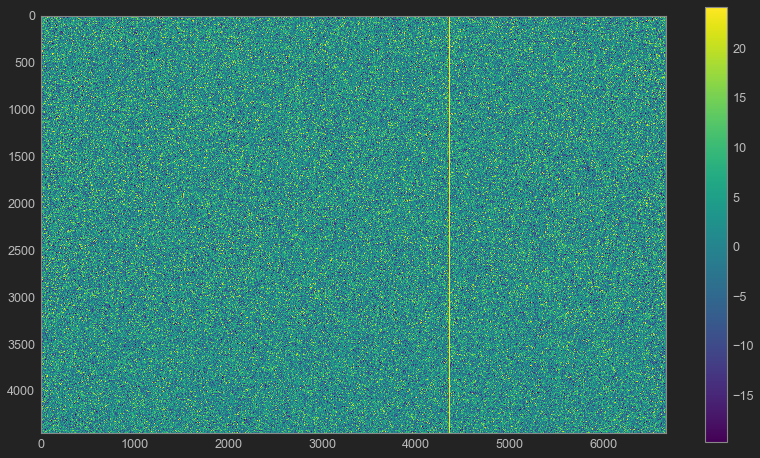

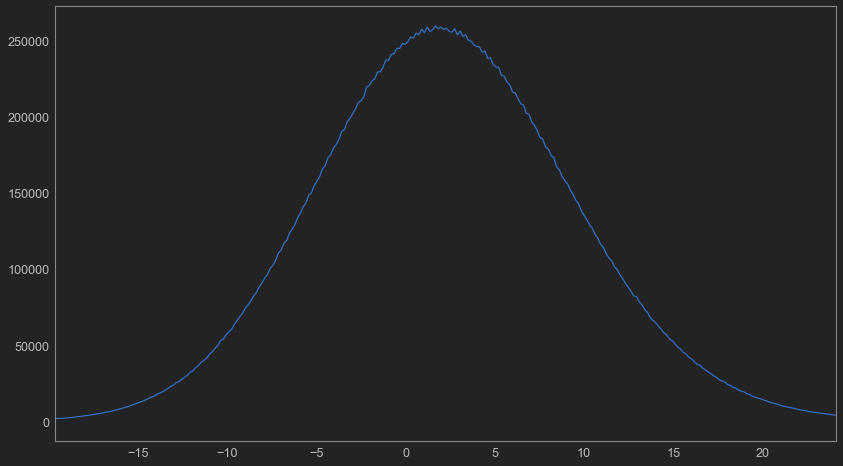

In [102]:
with fits.open("master_bias12.fits") as hdul:
    img = hdul[0].data - master_bias_mean_10_cf
    plotimg(img,3)
    plothist(img,sig=3)
    print(np.mean(img[:,4356]))

(1068.4582006527316, 10.235879199216289)


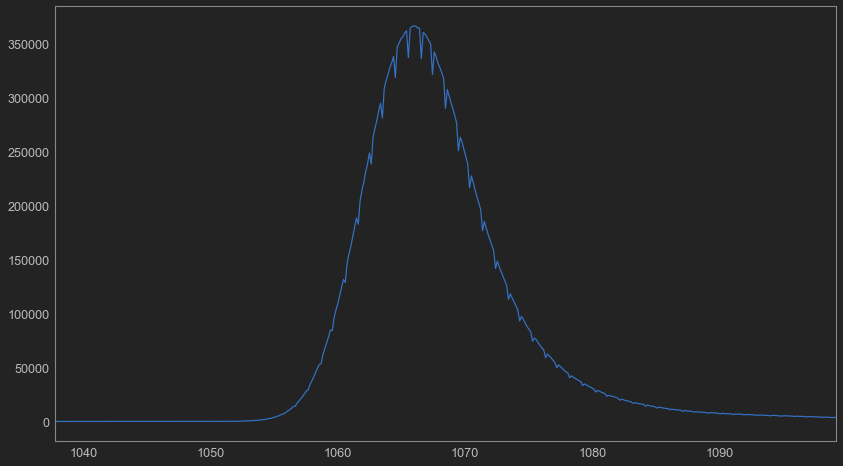

In [138]:
plothist(master_bias_mean_10_cf,sig=3)